<a href="https://colab.research.google.com/github/alanbseo/MFAworkshop/blob/main/PlasticMFA_1_PolymerCaseStudy.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

A Jupyter notebook converted from Kawecki et al. (2021), using DPMFA (dynamic probabilistic material flow analysis) package

Source: Kawecki et al. (2021), Polymer-specific dynamic probabilistic material flow analysis of seven
polymers in Europe from 1950 to 2016

All the Python scripts and SQL database used to perform the calculations
are available at https://github.com/empa-tsl/plastic-dpmfa
The full results of the DPMFA are available at https://doi.org/10.5281/zenodo.4756698
DPMFA package available at https://github.com/isr-ifi/dpmfa/

Original script created on 09.04.2020
@author: dew

modified by ABS

In [8]:
# import packages
import sys
import os
import csv
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages



In [1]:
!pip install dpmfa

In [3]:
from google.colab import drive
drive.mount('/content/gdrive/')


Mounted at /content/gdrive/


In [9]:
# list the files in the gdrive
%ls /content/gdrive
# or
!ls '/content/gdrive/MyDrive/Net zero built environment/MFA workshop/PlasticMFA2024/'

MyDrive/
Literature  plastic-dpmfa-master


In [10]:
# append gdrive path to system for reading module files

sys.path.append('/content/gdrive/MyDrive/Net zero built environment/MFA workshop/PlasticMFA2024/plastic-dpmfa-master')

py_file_location = '/content/gdrive/MyDrive/Net zero built environment/MFA workshop/PlasticMFA2024/plastic-dpmfa-master'
# print(os.path.abspath(py_file_location))
sys.path.append(os.path.abspath(py_file_location))

!ls '/content/gdrive/MyDrive/Net zero built environment/MFA workshop/PlasticMFA2024/plastic-dpmfa-master'

CaseStudy_Runner.py  Export_Calculation.py  README.md
data_casestudy	     output_casestudy	    setup_model_new.py
example		     __pycache__	    TruncatingFunctions.py


In [11]:
# import modules
import setup_model_new as su

# https://github.com/isr-ifi/dpmfa
# pip install dpmfa
from dpmfa import simulator as sc
from dpmfa import components as cp

In [12]:
# set working directory
default_path = '/content/gdrive/MyDrive/Net zero built environment/MFA workshop/PlasticMFA2024/plastic-dpmfa-master'
#default_path = '/content/gdrive/MyDrive/MFA workshop'

import os
os.chdir(default_path)
# verification
print(os.getcwd())          #print the current working directory


/content/gdrive/.shortcut-targets-by-id/1gDT-7hKMl37JnTVecJLmI9yB2rUI7rAo/MCM Google Drive/MFA workshop/PlasticMFA2024/plastic-dpmfa-master
/content/gdrive/.shortcut-targets-by-id/1gDT-7hKMl37JnTVecJLmI9yB2rUI7rAo/MCM Google Drive/MFA workshop/PlasticMFA2024/plastic-dpmfa-master


### Model set-up and run

In [13]:
startYear = 1950 # year of start of modelling
endYear = 2016

Tperiods = endYear - startYear + 1 # 67 # number of periods modelled (must be compatible with the inflow and TC data)
Speriod = 30 # period for printing a summary of the flows
RUNS = 100 # number of runs, determines the precision of the results


# Target materials, seven important polymers within the EU (Kawecki et al., 2018)
#mat = "PS" polystyrene
#mat = "PP"  # polypropylene
#mat = "EPS" # expanded polystyrene
#mat = "PVC" # polyvinylchloride
#mat = "HDPE" # high-density polyethylene
#mat = "PET" # polyethylene terephthalate
mat = "LDPE" # low-density polyethylene

modelname = mat+" in Europe"


In [14]:
# define the DB path
# SQLite 3 format (https://www.sqlite.org)
pathtoDB = os.path.join("data_casestudy","DPMFA_Plastic_EU_inclExport.db")

# define model
model = su.setupModel(pathtoDB,modelname,RUNS,mat, startYear, endYear)


Temporal range of input: 1950 - 2017
Temporal range of TCs: 1950 - 2017
Currently considering: 1950 - 2016
Inserting " Primary Production " as a Flow compartment
Inserting " Recycled Material Production " as a Flow compartment
Inserting " Transport " as a Flow compartment
Inserting " Fibre Production " as a Flow compartment
Inserting " Non-Textile Manufacturing " as a Flow compartment
Inserting " Textile Manufacturing " as a Flow compartment
Inserting " Packaging (sector) " as a Flow compartment
Inserting " Building and Construction (sector) " as a Flow compartment
Inserting " Automotive (sector) " as a Flow compartment
Inserting " Electrical and Electronic Equipment (sector) " as a Flow compartment
Inserting " Agriculture (sector) " as a Flow compartment
Inserting " Other Plastic Products (sector) " as a Flow compartment
Inserting " Clothing (sector) " as a Flow compartment
Inserting " Household Textiles (sector) " as a Flow compartment
Inserting " Technical Textiles (sector) " as a F

In [15]:
# check validity
model.checkModelValidity()
# print out the model content for verification by the experimenter
model.debugModel()

In [16]:
print(f"Set-up and run a simulation; number of runs=", RUNS)

# set up the simulator object
simulator = sc.Simulator(RUNS, periods = Tperiods, seed = 2250, useGlobalTCSettings = True, normalizeTCs = True) # 2250 is a random seed
# define what model needs to be run
simulator.setModel(model)
# run the model
simulator.runSimulation()
# simulator.debugSimulator()

print("Simulation finished")

Set-up and run a simulation; number of runs= 100
Simulation finished


In [18]:
# compartment with loggedInflows
loggedInflows = simulator.getLoggedInflows()

# compartment with loggedOutflows
loggedOutflows = simulator.getLoggedOutflows()

# find out the sinks and the stocks of the system
sinks = simulator.getSinks()
stocks = simulator.getStocks()


In [19]:
# print(loggedInflows)
loggedInflows.__class__
len(loggedInflows)

45

Plotting

<ipython-input-20-8a5c22d01983>:43: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure('INFLOW_'+ key)


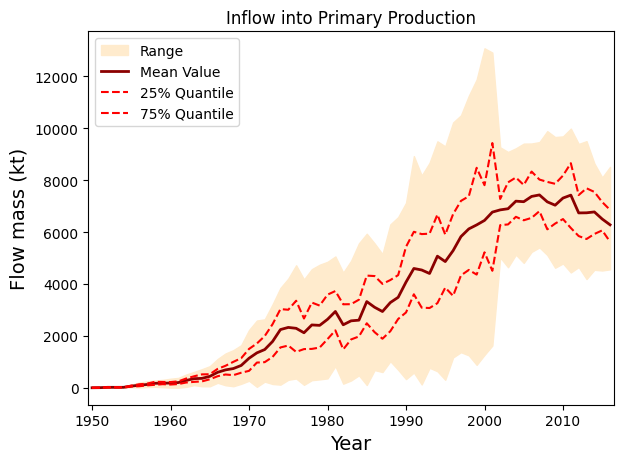

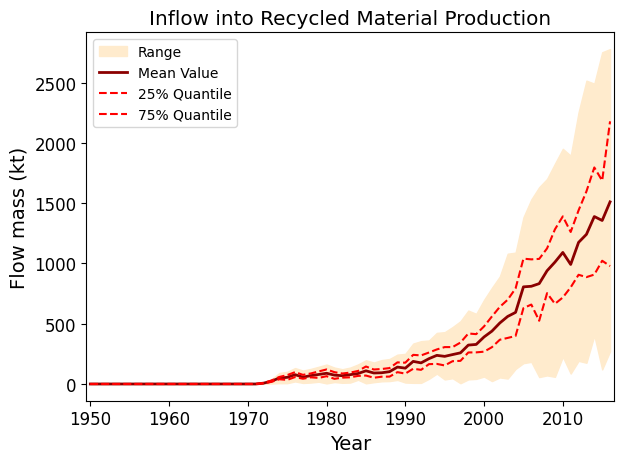

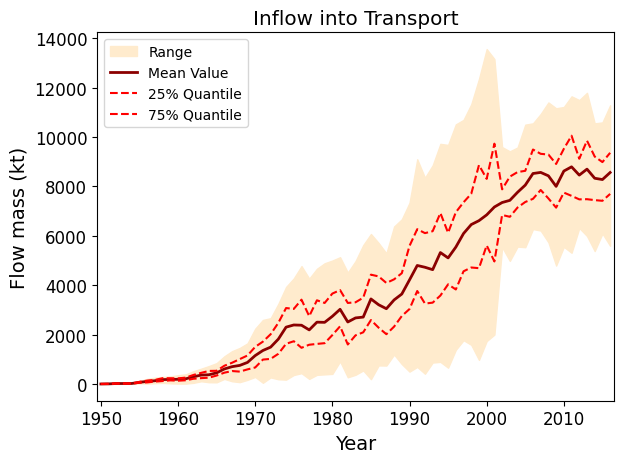

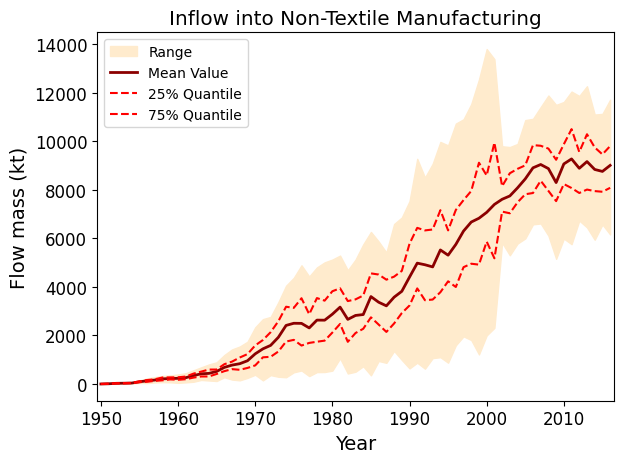

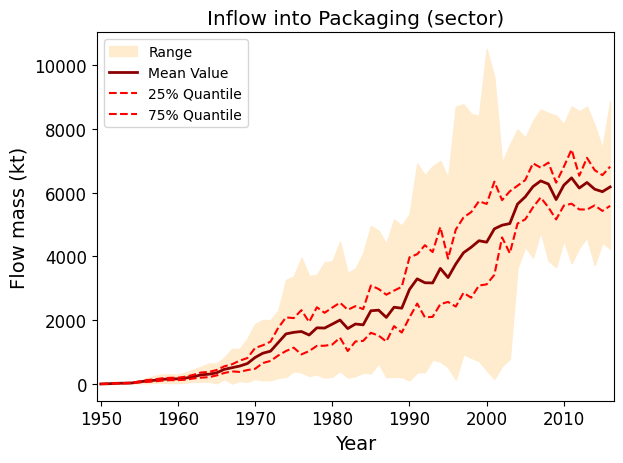

...

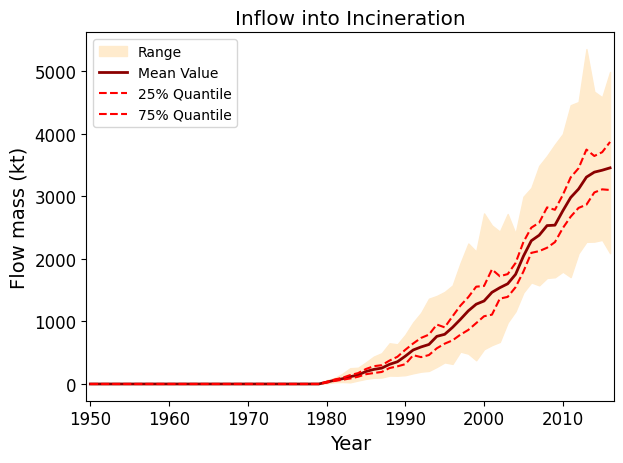

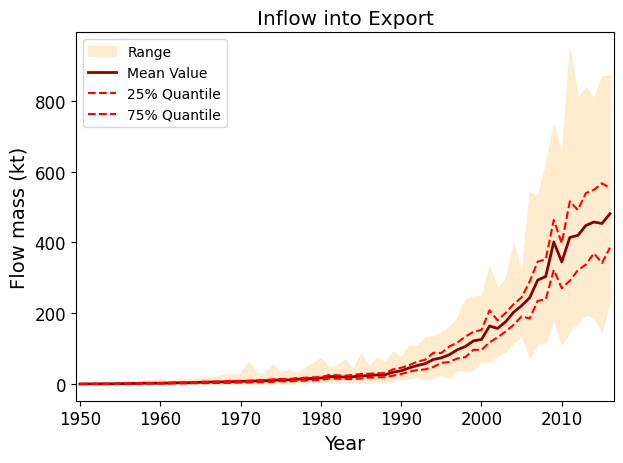

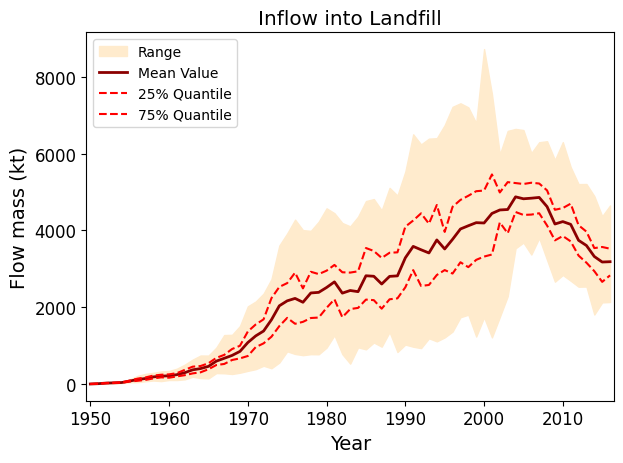

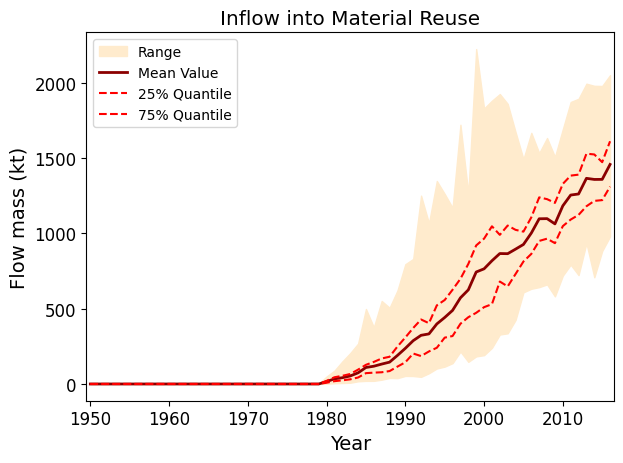

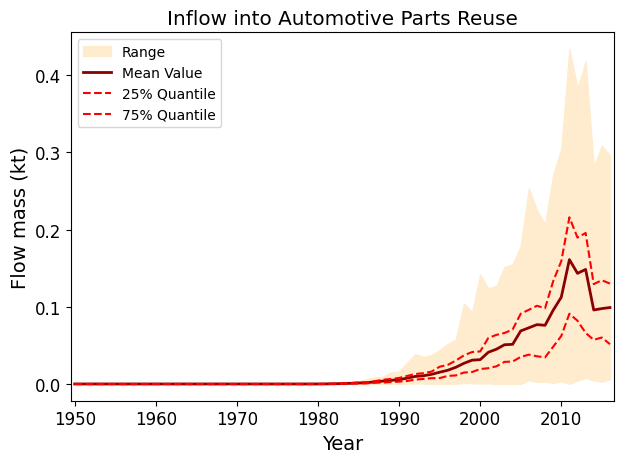

In [20]:
### plot inflow

# for plots
xScale=np.arange(startYear,startYear+Tperiods)


# create pdf document with multiple pages
pdfname = 'output_casestudy/EU/TimeSeries_INFLOW_'+mat+'.pdf'


# Check if the base directory exists

base_folder = os.path.dirname(pdfname)

if not os.path.exists(base_folder):
    # If not, create the directory
    os.makedirs(base_folder)
    print(f"Created base folder: {base_folder}")

pp = PdfPages(pdfname)




## display mean for each inflow
for key, value in loggedInflows.items():
    data = value*1000

    mean=[]
    q25=[]
    q75=[]
    minimum=[]
    maximum=[]

    for i in range(0,np.shape(data)[1]):
        mean.append(np.mean(data[:,i]))
        q25.append(np.percentile(data[:,i],25))
        q75.append(np.percentile(data[:,i],75))
        minimum.append(np.min(data[:,i]))
        maximum.append(np.max(data[:,i]))

    # create a new figure
    fig = plt.figure('INFLOW_'+ key)
    plt.xlabel('Year',fontsize=14)
    plt.ylabel('Flow mass (kt)',fontsize=14)
    plt.title('Inflow into '+key)
    plt.rcParams['font.size']=12 # tick's font
    plt.xlim(xmin=startYear-0.5, xmax=startYear+Tperiods-0.5)
    plt.fill_between(xScale, minimum, maximum, color='blanchedalmond', label="Range")
    plt.plot(xScale,mean, color = 'darkred', linewidth=2, label='Mean Value')
    plt.plot(xScale, q25, color = 'red', linestyle='dashed', linewidth=1.5, label = '25% Quantile')
    plt.plot(xScale, q75, color = 'red', linestyle='dashed', linewidth=1.5, label = '75% Quantile')
    plt.legend(loc='upper left', fontsize = 'small')
    plt.tight_layout()
    pp.savefig()
    # fig.savefig('output_casestudy/EU/TimeSeries_INFLOW_'+ key+'.pdf', bbox_inches='tight')

# close the multipage pdf object
pp.close()






<ipython-input-21-fd0f44aed94d>:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure('OUTFLOW_'+ Comp.name +' to ' + comp)


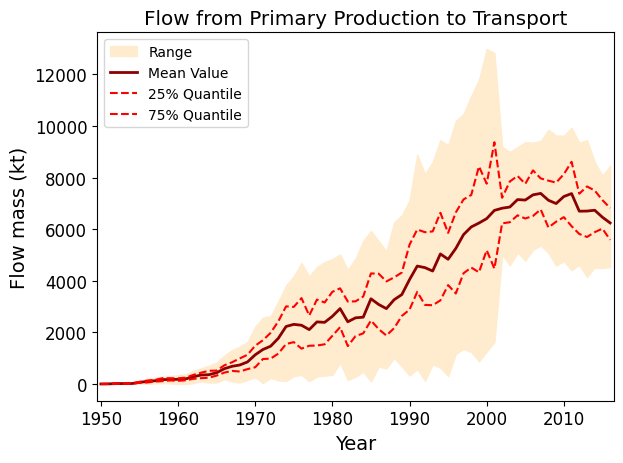

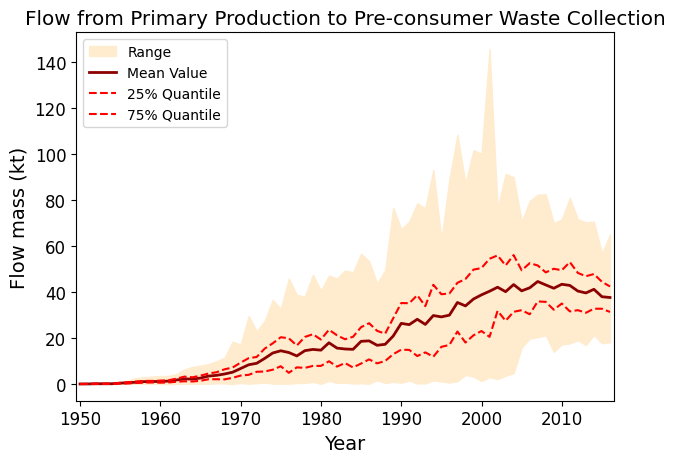

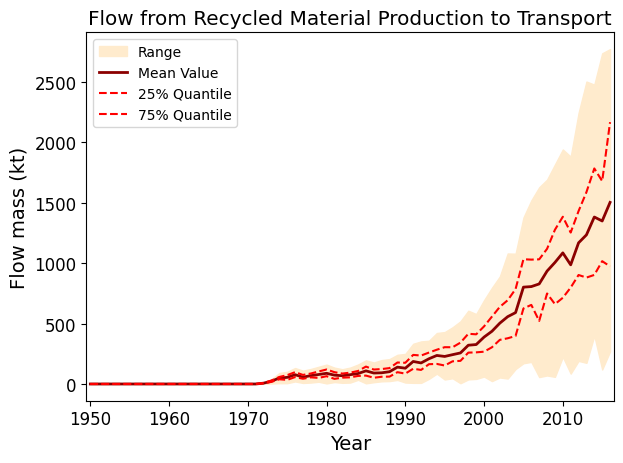

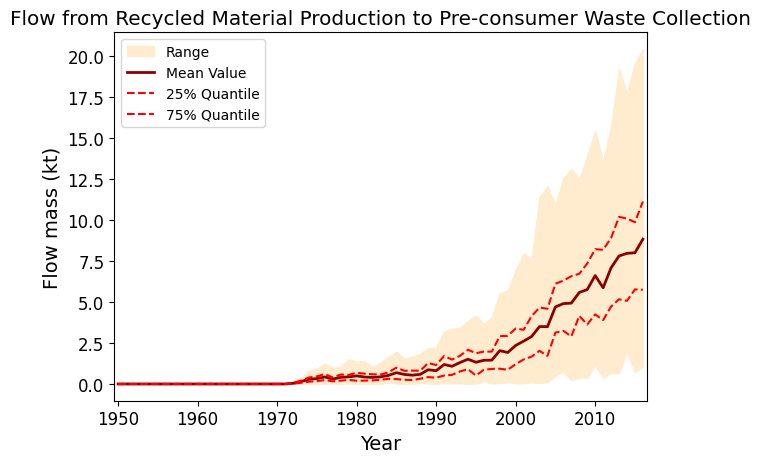

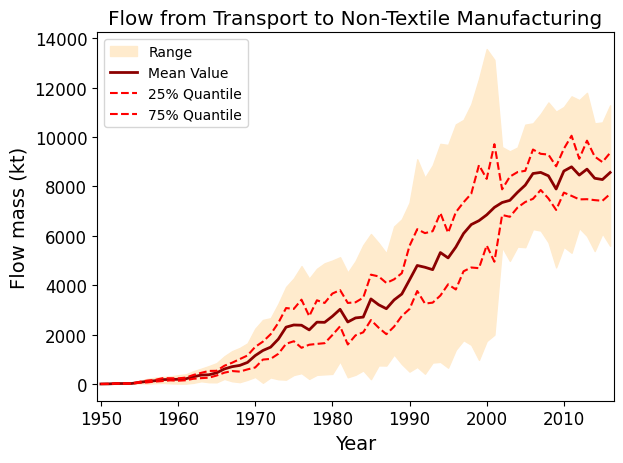

...

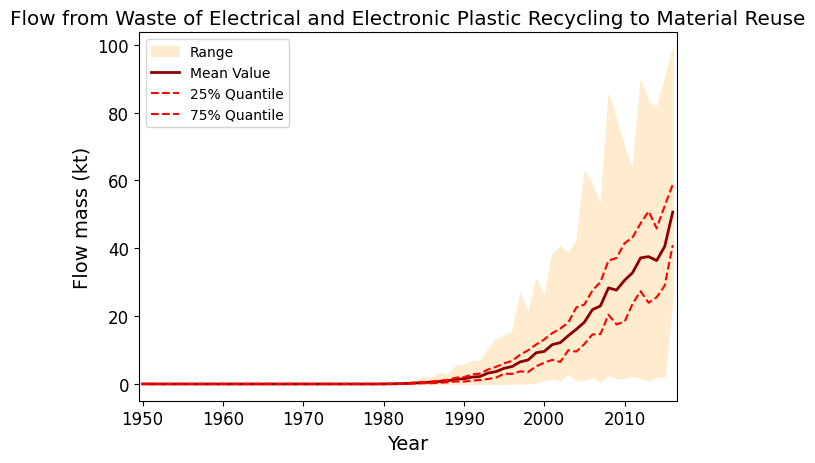

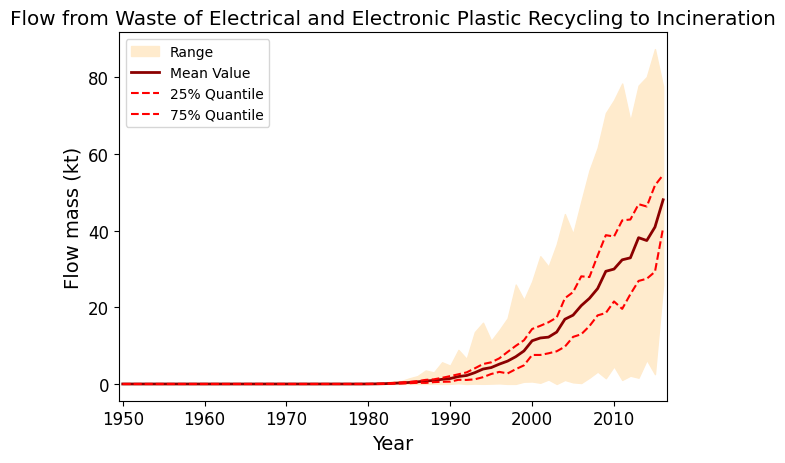

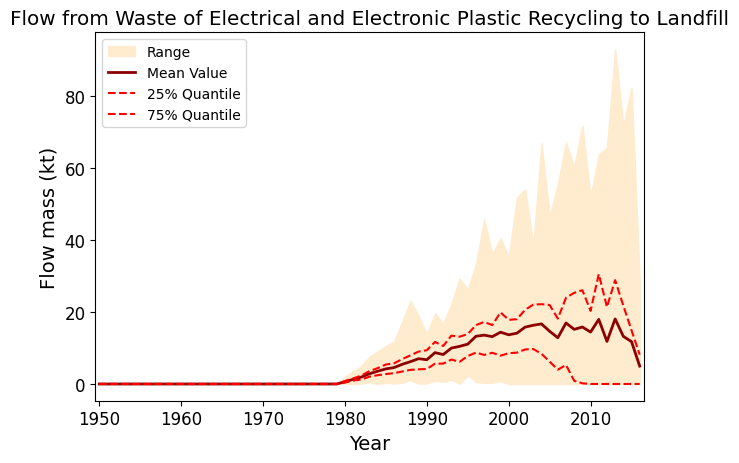

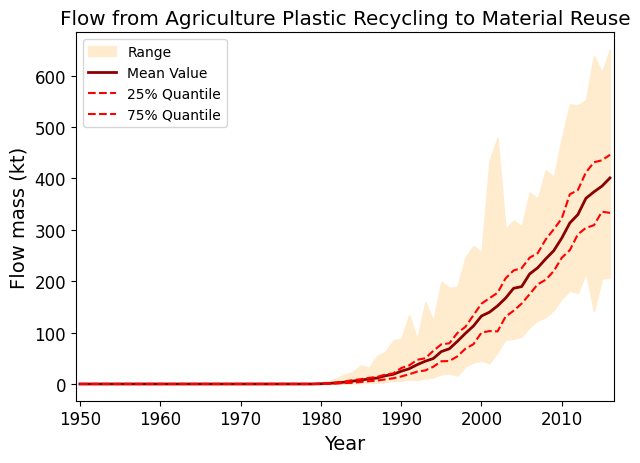

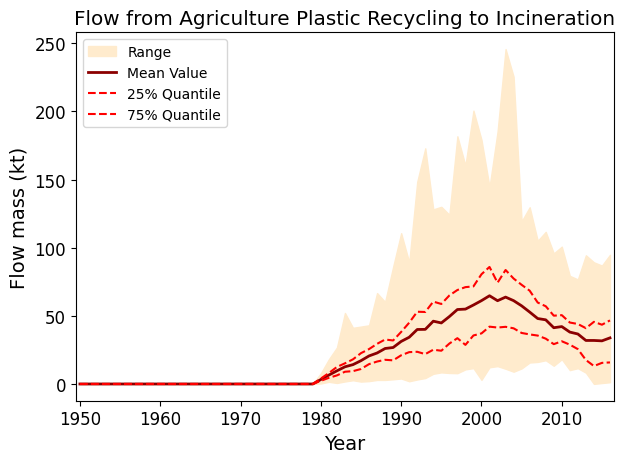

In [21]:

### plot outflow


# create pdf document with multiple pages
pp = PdfPages('output_casestudy/EU/TimeSeries_OUTFLOW_'+mat+'.pdf')

for Comp in loggedOutflows:

    # in this case name is the key, value is the matrix(data), in this case .items is needed
    for comp, value in Comp.outflowRecord.items():

        data = value*1000

        mean=[]
        q25=[]
        q75=[]
        minimum=[]
        maximum=[]

        for i in range(0,np.shape(data)[1]):
            mean.append(np.mean(data[:,i]))
            q25.append(np.percentile(data[:,i],25))
            q75.append(np.percentile(data[:,i],75))
            minimum.append(np.min(data[:,i]))
            maximum.append(np.max(data[:,i]))

        # create a new figure
        fig = plt.figure('OUTFLOW_'+ Comp.name +' to ' + comp)
        plt.xlabel('Year',fontsize=14)
        plt.ylabel('Flow mass (kt)',fontsize=14)
        plt.title('Flow from '+Comp.name+' to ' + comp)
        plt.rcParams['font.size']=12 # tick's font
        plt.xlim(xmin=startYear-0.5, xmax=startYear+Tperiods-0.5)
        plt.fill_between(xScale, minimum, maximum, color='blanchedalmond', label="Range")
        plt.plot(xScale,mean, color = 'darkred', linewidth=2, label='Mean Value')
        plt.plot(xScale, q25, color = 'red', linestyle='dashed', linewidth=1.5, label = '25% Quantile')
        plt.plot(xScale, q75, color = 'red', linestyle='dashed', linewidth=1.5, label = '75% Quantile')
        plt.legend(loc='upper left', fontsize = 'small')
        plt.tight_layout()
        pp.savefig()

# close the multipage pdf object
pp.close()

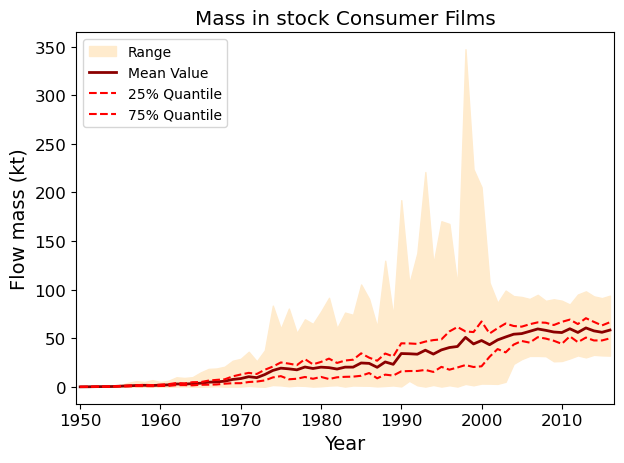

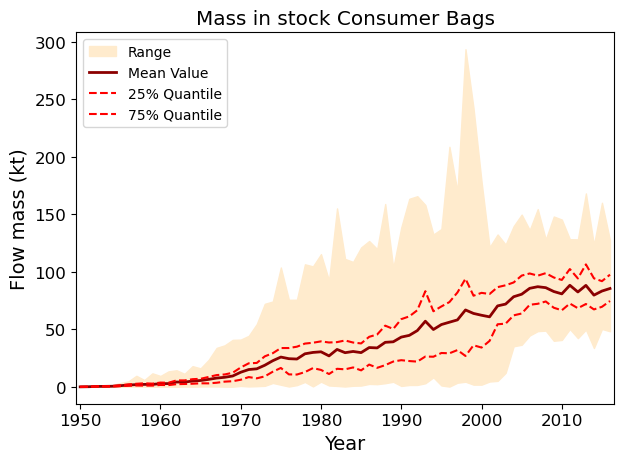

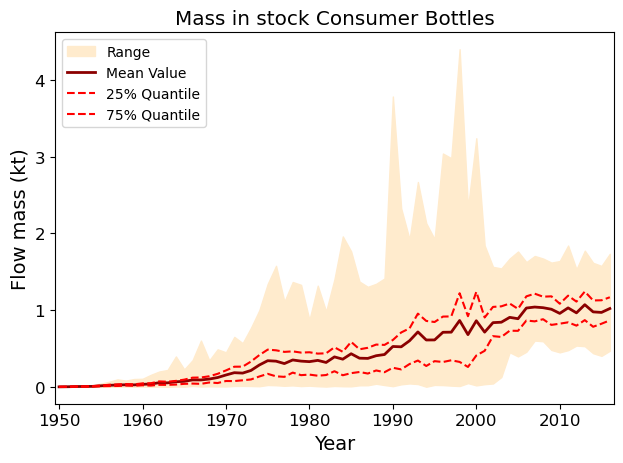

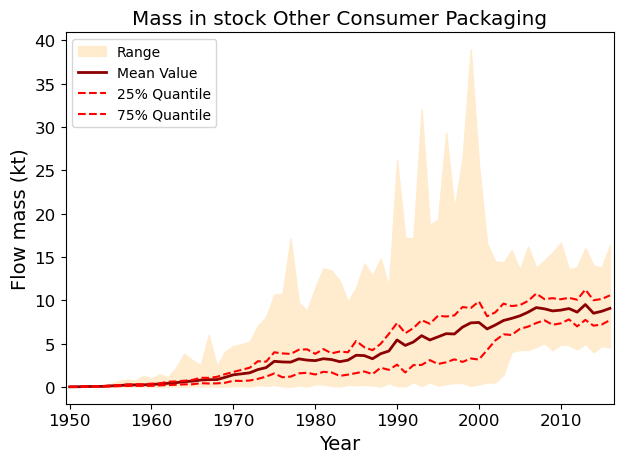

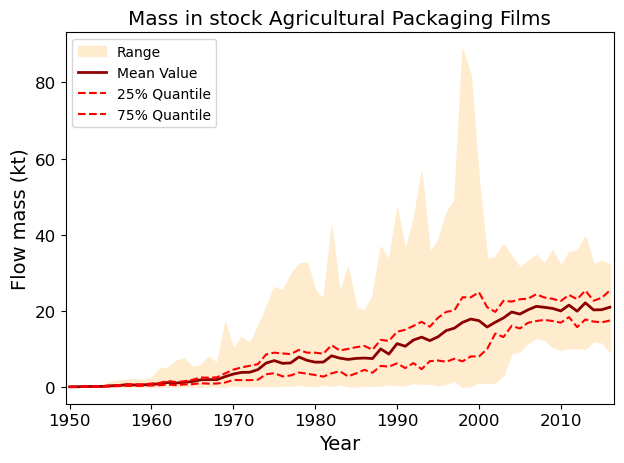

...

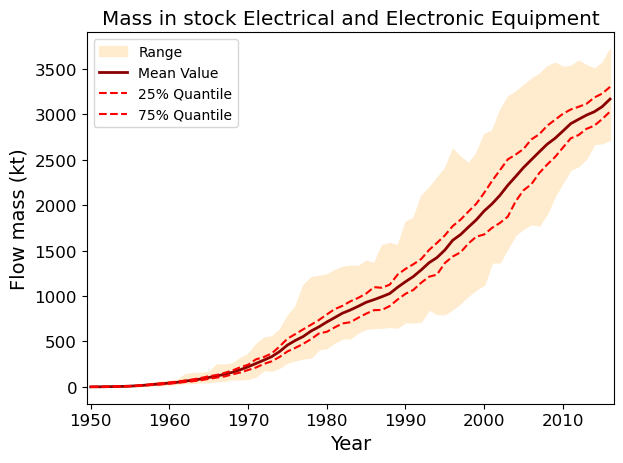

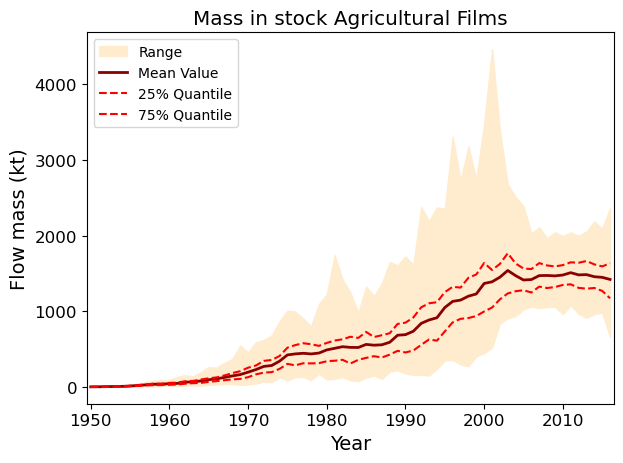

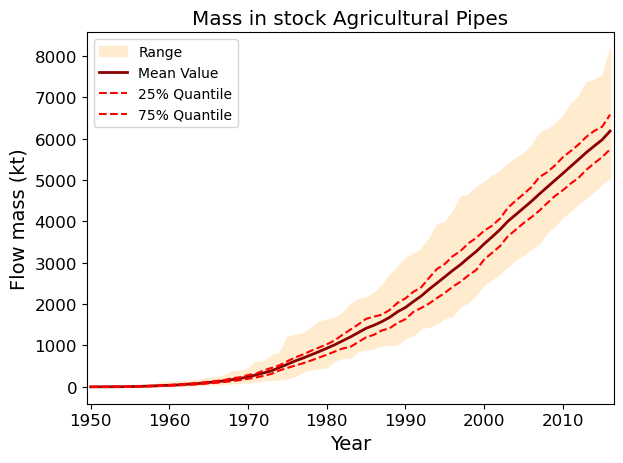

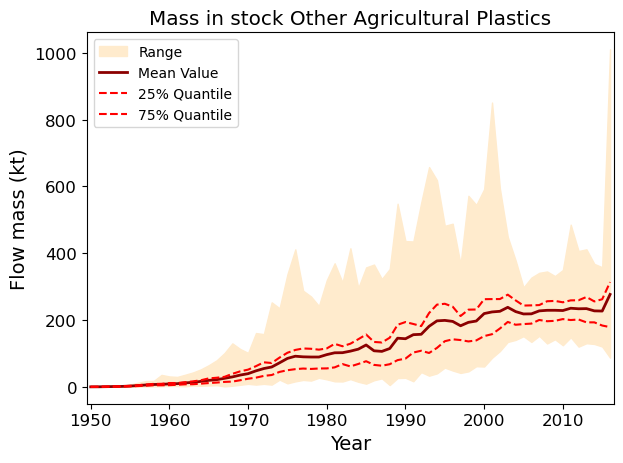

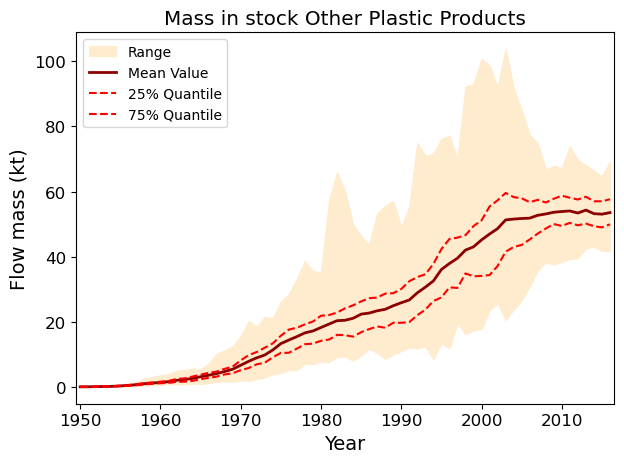

In [ ]:

### plot stocks

# create pdf document with multiple pages
pp = PdfPages('output_casestudy/EU/TimeSeries_STOCK_'+mat+'.pdf')

for stock in stocks:

    data = stock.inventory*1000

    mean=[]
    q25=[]
    q75=[]
    minimum=[]
    maximum=[]

    for i in range(0,np.shape(data)[1]):
        mean.append(np.mean(data[:,i]))
        q25.append(np.percentile(data[:,i],25))
        q75.append(np.percentile(data[:,i],75))
        minimum.append(np.min(data[:,i]))
        maximum.append(np.max(data[:,i]))

    # create a new figure
    fig = plt.figure('STOCK_'+ stock.name)
    plt.xlabel('Year',fontsize=14)
    plt.ylabel('Flow mass (kt)',fontsize=14)
    plt.title('Mass in stock '+stock.name)
    plt.rcParams['font.size']=12 # tick's font
    plt.xlim(xmin=startYear-0.5, xmax=startYear+Tperiods-0.5)
    plt.fill_between(xScale, minimum, maximum, color='blanchedalmond', label="Range")
    plt.plot(xScale,mean, color = 'darkred', linewidth=2, label='Mean Value')
    plt.plot(xScale, q25, color = 'red', linestyle='dashed', linewidth=1.5, label = '25% Quantile')
    plt.plot(xScale, q75, color = 'red', linestyle='dashed', linewidth=1.5, label = '75% Quantile')
    plt.legend(loc='upper left', fontsize = 'small')
    plt.tight_layout()
    pp.savefig()

# close the multipage pdf object
pp.close()


-----------------------
Logged Outflows period 66 (year: 2016):

Flows from Primary Production:
 --> Transport: Mean = 6417.0 ± 987.0
 --> Pre-consumer Waste Collection: Mean = 39.0 ± 10.0

Flows from Recycled Material Production:
 --> Transport: Mean = 1487.0 ± 563.0
 --> Pre-consumer Waste Collection: Mean = 9.0 ± 4.0

Flows from Transport:
 --> Non-Textile Manufacturing: Mean = 8747.0 ± 1056.0
 --> Export: Mean = 0.0 ± 0.0

Flows from Non-Textile Manufacturing:
 --> Packaging (sector): Mean = 6257.0 ± 865.0
 --> Building and Construction (sector): Mean = 487.0 ± 100.0
 --> Agriculture (sector): Mean = 1408.0 ± 610.0
 --> Automotive (sector): Mean = 150.0 ± 32.0
 --> Electrical and Electronic Equipment (sector): Mean = 254.0 ± 69.0
 --> Other Plastic Products (sector): Mean = 12.0 ± 3.0
 --> Pre-consumer Waste Collection: Mean = 621.0 ± 140.0

Flows from Packaging (sector):
 --> Consumer Films: Mean = 584.0 ± 124.0
 --> Consumer Bags: Mean = 855.0 ± 176.0
 --> Consumer Bottles: Mean 

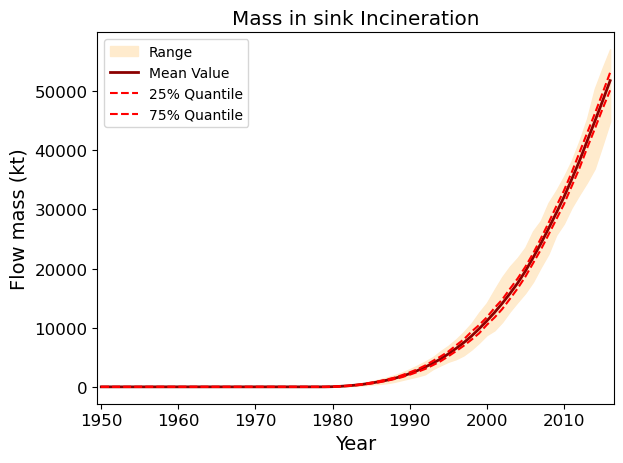

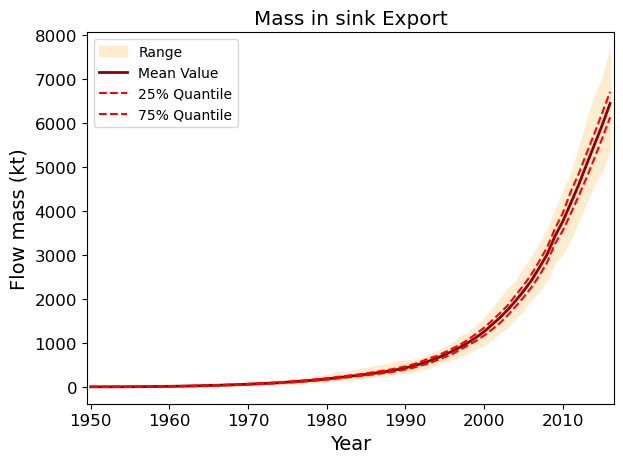

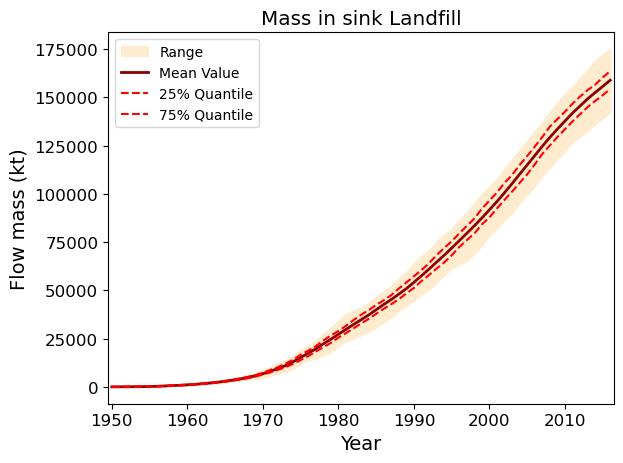

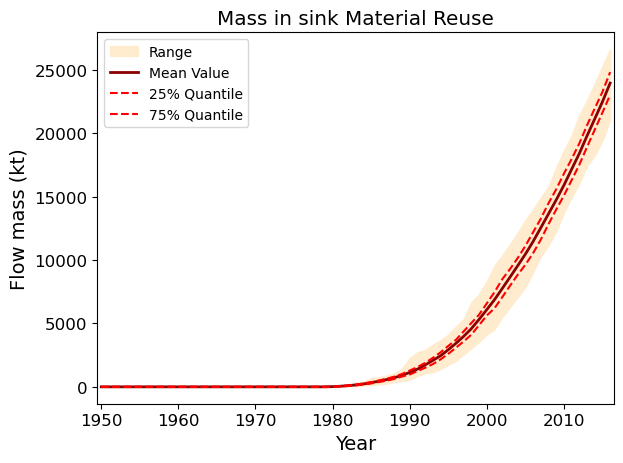

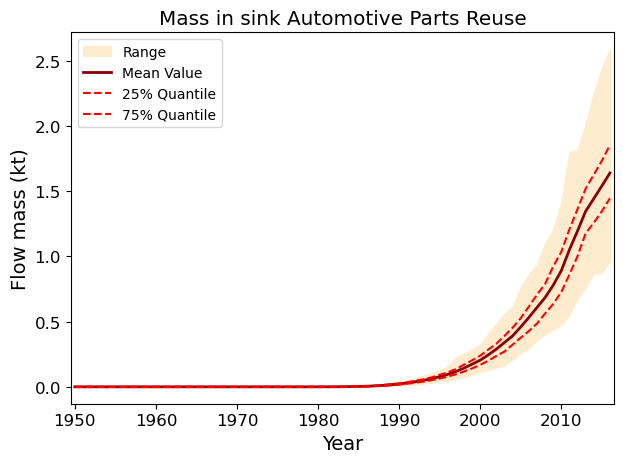

In [ ]:

### plot sinks

# create pdf document with multiple pages
pp = PdfPages('output_casestudy/EU/TimeSeries_SINK_'+mat+'.pdf')

for sink in sinks:

    if isinstance(sink,cp.Stock):
        continue

    data = sink.inventory*1000

    mean=[]
    q25=[]
    q75=[]
    minimum=[]
    maximum=[]

    for i in range(0,np.shape(data)[1]):
        mean.append(np.mean(data[:,i]))
        q25.append(np.percentile(data[:,i],25))
        q75.append(np.percentile(data[:,i],75))
        minimum.append(np.min(data[:,i]))
        maximum.append(np.max(data[:,i]))

    # create a new figure
    fig = plt.figure('SINK_'+ sink.name)
    plt.xlabel('Year',fontsize=14)
    plt.ylabel('Flow mass (kt)',fontsize=14)
    plt.title('Mass in sink '+sink.name)
    plt.rcParams['font.size']=12 # tick's font
    plt.xlim(xmin=startYear-0.5, xmax=startYear+Tperiods-0.5)
    plt.fill_between(xScale, minimum, maximum, color='blanchedalmond', label="Range")
    plt.plot(xScale,mean, color = 'darkred', linewidth=2, label='Mean Value')
    plt.plot(xScale, q25, color = 'red', linestyle='dashed', linewidth=1.5, label = '25% Quantile')
    plt.plot(xScale, q75, color = 'red', linestyle='dashed', linewidth=1.5, label = '75% Quantile')
    plt.legend(loc='upper left', fontsize = 'small')
    plt.tight_layout()
    pp.savefig()

# close the multipage pdf object
pp.close()


## display mean ± std for each outflow
print('-----------------------')
for Speriod in [66]:
    print('Logged Outflows period '+str(Speriod)+' (year: '+str(startYear+Speriod)+'):')
    print('')
    # loop over the list of compartments with loggedoutflows
    for Comp in loggedOutflows:
        print('Flows from ' + Comp.name +':' )
        # in this case name is the key, value is the matrix(data), in this case .items is needed
        for Target_name, value in Comp.outflowRecord.items():
            print(' --> ' + str(Target_name)+ ': Mean = '+str(round(np.mean(value[:,Speriod]*1000),0))+' ± '+str(round(np.std(value[:,Speriod]*1000),0))   )
        print('')
print('-----------------------')


### Export data

Automatically generated csv files with the results from the DPMFA for each compartment and polymer. Each file contains a table with one entry per year (1950-2016) and one entry per model run (n = RUNS)
- total inflows per compartment: "loggedInflows_MATERIAL_COMPARTMENT.csv"
- outflows per compartment: "loggedOutflows_MATERIAL_COMPARTMENT_to_COMPARTMENT.csv"
- mass in sink: "sinks_MATERIAL_COMPARTMENT.csv"
- mass in stock: "stocks_MATERIAL_COMPARTMENT.csv"


In [ ]:
# Check if the base directory exists

csv_folder = os.path.join("output_casestudy","EU","csv")
# print(csv_folder)
if not os.path.exists(csv_folder):
    # If not, create the directory
    os.makedirs(csv_folder)
    print(f"Created csv folder: {csv_folder}")


Created csv folder: output_casestudy/EU/csv


In [22]:


# export outflows to csv
for Comp in loggedOutflows: # loggedOutflows is the compartment list of compartmensts with loggedoutflows
    for Target_name, value in Comp.outflowRecord.items(): # in this case name is the key, value is the matrix(data), in this case .items is needed
        with open(os.path.join("output_casestudy","EU","csv","loggedOutflows_"+mat+"_" + Comp.name + "_to_" + Target_name + ".csv"), 'w') as RM :
            a = csv.writer(RM, delimiter=' ')
            data = np.asarray(value)
            a.writerows(data)

# export inflows to csv
for Comp in loggedInflows: # loggedOutflows is the compartment list of compartmensts with loggedoutflows
    with open(os.path.join("output_casestudy","EU","csv","loggedInflows_"+mat+"_" + Comp + ".csv"), 'w') as RM :
        a = csv.writer(RM, delimiter=' ')
        data = np.asarray(loggedInflows[Comp])
        a.writerows(data)

# export sinks to csv
for sink in sinks:
    if isinstance(sink,cp.Stock):
        continue
    with open(os.path.join("output_casestudy","EU","csv","sinks_"+mat+"_" + sink.name + ".csv"), 'w') as RM :
        a = csv.writer(RM, delimiter=' ')
        data = np.asarray(sink.inventory)
        a.writerows(data)

# export stocks to csv
for stock in stocks:
    with open(os.path.join("output_casestudy","EU","csv","stocks_"+mat+"_" + stock.name + ".csv"), 'w') as RM :
        a = csv.writer(RM, delimiter=' ')
        data = np.asarray(stock.inventory)
        a.writerows(data)
